In [2]:
import os
from IPython.display import Audio
import dotenv
import torch
from torchaudio import load
from matplotlib import pyplot as plt
import numpy as np

from hydra.utils import instantiate
from hydra import compose, initialize
import pytorch_lightning as pl
from omegaconf import DictConfig, open_dict
from audio_diffusion_pytorch import DiffusionModel, UNetV0, VDiffusion, VSampler

from train.main.models import get_default_combined_sampler

In [3]:
model = get_default_combined_sampler()
#model = get_default_combined_sampler(diffgen_state_dict_file="/data/logs/ckpts/diffgen_v2_state_dict")
print(type(model))

<class 'train.main.models.CombinedSampler'>


In [4]:
#labels text xeno canto labels not used during training
texts = ['Loxia curvirostra; morning; June; 2016; United States; 3 of 5; call',
 'Fringilla coelebs; morning; July; 2021; Polska; 4 of 5; song; Regulus ignicapilla; Troglodytes troglodytes; Sylvia atricapilla',
 'Sitta europaea; morning; April; 2021; France; 5 of 5; call',
 'Henicorhina leucophrys; ; November; 1996; Ecuador; 5 of 5; call; Zonotrichia capensis; Troglodytes solstitialis',
 'Tangara argyrofenges; afternoon; September; 2009; Bolivia; 4 of 5; song; call; Pharomachrus antisianus; Chiroxiphia boliviana; Chamaeza campanisona; Entomodestes leucotis; Crypturellus obsoletus; Chlorospingus flavopectus; Anisognathus somptuosus',
 'Platyrinchus leucoryphus; evening; May; 2017; Brasil; 5 of 5; call',
 'Poecilotriccus capitalis; morning; December; 2004; Perú; 4 of 5; call',
 'Scolopax rusticola; morning; February; 2021; France; 3 of 5; call; Turdus philomelos',
 'Fringilla coelebs; morning; March; 2020; United Kingdom; 3 of 5; song; adult; Alauda arvensis',
 'Pulsatrix perspicillata; ; August; 1997; Ecuador; 5 of 5; song',
 'Cuculus canorus; morning; May; 2019; Éire / Ireland; 5 of 5; call',
 'Herpsilochmus rufimarginatus; evening; February; 2016; Brasil; 4 of 5; call; Dacnis cayana; Aphantochroa cirrochloris; Ramphodon naevius; Ramphocelus bresilia',
 'Crypturellus berlepschi; evening; May; 2019; Colombia; 4 of 5; song; Turdus obsoletus',
 'Puffinus puffinus; night; May; 2016; United Kingdom; 1 of 5; call; wing beats',
 'Batis crypta; morning; February; 1992; Tanzania; 3 of 5; call; Bradypterus lopezi; Modulatrix stictigula',
 'Oriturus superciliosus; morning; March; 2005; México; 5 of 5; song',
 'Xenodacnis parina; morning; October; 2014; Ecuador; 4 of 5; song',
 'Acrocephalus melanopogon; morning; March; 2017; France; 5 of 5; song',
 'Troglodytes troglodytes; morning; May; 2012; Nederland; 4 of 5; song; Fringilla coelebs',
 'Dichrozona cincta; morning; July; 2012; Brasil; 4 of 5; song',
 'Cygnus cygnus; afternoon; December; 2019; Polska; 4 of 5; call; adult; Ardea cinerea; Anas platyrhynchos',
 'Vireo chivi; morning; December; 1999; Brasil; 4 of 5; Galbula ruficauda; Xiphocolaptes falcirostris; Myiodynastes maculatus',
 'Leiothlypis ruficapilla; morning; June; 2013; Canada; 5 of 5; song',
 'Sturnella magna; morning; April; 2015; United States; 4 of 5; song; Quiscalus major; Dendrocygna autumnalis',
 'Phylloscopus trochilus; ; April; 2019; Norge; 4 of 5; song',
 'Helopsaltes certhiola; morning; December; 2019; India; 3 of 5; call; Prinia socialis',
 'Leptotila verreauxi; morning; June; 2017; Panamá; 4 of 5; song; Brotogeris jugularis; Troglodytes aedon; Cantorchilus elutus; Legatus leucophaius; Pachyramphus cinnamomeus; Amazona autumnalis; Sporophila corvina; Tyrannus melancholicus; Celeus loricatus',
 'Anthracothorax nigricollis; morning; October; 2010; Brasil; 5 of 5',
 'Lanius bucephalus; morning; October; 2015; 日本; 4 of 5; call; Corvus macrorhynchos',
 'Psilopsiagon aurifrons; afternoon; January; 2013; Argentina; 2 of 5; song',
 'Unknown; morning; May; 2019; Deutschland; 4 of 5; song; call',
 'Erithacus rubecula; night; April; 2021; Deutschland; 3 of 5; call']

In [11]:
# pass single string or list of strings for batched computation in first position
# latent length should be power of 2, longer latent length results in longer output audio
# higher embedding scale results in higher importance of embeddings in generating proces
out = model.sample(texts[:4], sampling_steps=100, decoding_steps=100, latent_length=512, embedding_scale=15)

In [12]:
sr = 32000
for i in range(out.shape[0]):
    wave = out[i, ...]
    display(Audio(data=wave.cpu().numpy(), rate=sr))

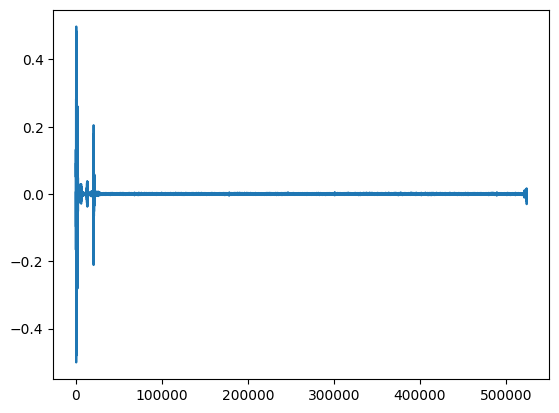

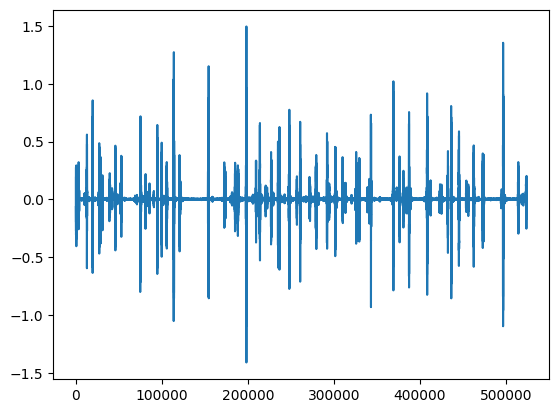

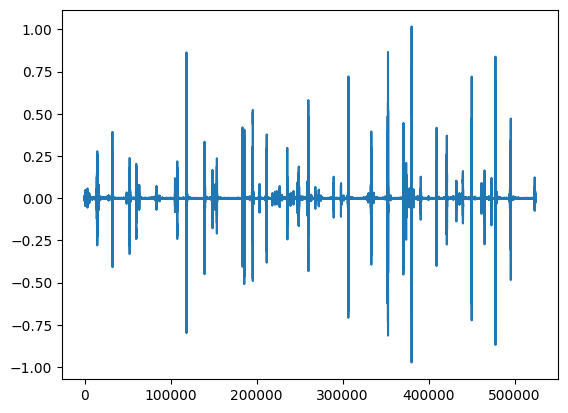

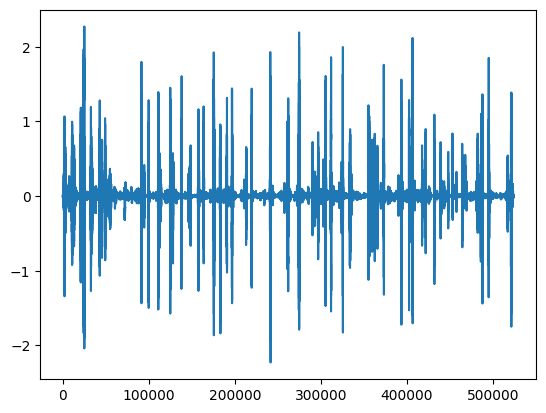

In [10]:
import pandas as pd
for i in range(out.shape[0]):
    audio = out[i, ...].cpu()
    mono = audio.mean(0)
    pd.Series(mono).plot()
    plt.show() 